# Passo 1 - Analise do panorama geral

1. Abordar o problema:
    O problema proposto envolve a análise de falhas em motores elétricos industriais. O objetivo do projeto é propor um classificador de falhas dos equipamentos com o intuito de melhorar o planejameneto e otimizar os processos de manutenção.
     
2. Medida de desempenho:
    Para a análise inicial do problema, irá ser utilizado o recall (sensibilidade), que irá analisar a proporção de verdadeiros positivos em relação ao total de instâncias positivas reais. Isso é feito com o foco em que devemos ter o mínimo de casos de falso negativo, ou seja, evitar a indicação de situação normal, quando há falha.
     
3. Verificação de hipótese:
    Vibração pode acabar indicando mais o desbalanceamneto e o desalinhamento;
    Pico de corrente podem indicar a sobrecarga e desacoplado (girando livre);

**Passo 1 - Carregando os Dados para análise**

1. Carrega-se os dados a partir de um arquivo csv;
2. Verifica-se os valores, tipos e estruturas dos dados;
3. Verificar os dados faltantes e balanceamento.

In [1]:
# Importando as bibliotecas necessárias para atuar

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# Adotando a função read_csv da biblioteca pandas para ler arquivo .csv de dados 
motores = pd.read_csv('Dataset APS1_Sinais Eletricos e Vibracao_csv.xls')

In [3]:
# Exibindo os dados carregado
motores

,tempo_s,tipo_setup,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
0,0.00,0.0,0.44905,63.67320,1.43660,0.042740,21.869566,0.113479,0.175,91.738,0.406,12.474475,15.435837,4.223108,-50.647991,-63.189443,-47.864704,-59.629807,-73.010381,-49.583755
1,0.08,0.0,0.44610,69.40320,1.67860,0.048945,1.600020,0.854342,0.227,7.359,3.843,20.070610,13.335535,16.966677,-50.696943,-63.340003,-48.313132,-59.591150,-72.360239,-49.473893
2,0.16,0.0,0.45175,69.11385,1.39950,0.042337,5.220348,0.284000,0.207,24.185,1.395,19.087723,7.345771,11.032327,-47.724322,-62.837371,-48.384219,-55.194912,-63.127903,-48.083630
3,0.24,0.0,0.43510,68.85665,1.39705,0.063224,3.437546,0.219507,0.228,16.040,0.973,6.869051,19.849528,9.136137,-47.652608,-62.613368,-48.768793,-55.275822,-63.310116,-47.937933
4,0.32,0.0,0.45055,70.52860,1.43375,0.048497,1.240032,0.111967,0.222,4.394,0.425,20.205840,2.325535,2.818658,-47.019446,-61.314274,-49.016646,-54.665312,-60.825200,-47.886619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,39.68,4.0,0.46575,68.42795,1.59235,0.042147,8.058820,0.900427,0.199,37.403,4.276,5.486469,22.266532,21.582764,-33.195195,-52.502279,-41.610532,-37.874381,-49.147213,-42.417970
2501,39.76,4.0,0.44705,62.32815,1.57365,0.068987,15.876663,0.904702,0.231,62.159,4.218,5.237910,11.518238,21.593782,-33.360763,-52.868492,-42.054637,-37.995903,-49.251871,-42.703237
2502,39.84,4.0,0.47110,76.04075,1.77275,0.045194,34.799709,1.657858,0.191,184.906,7.810,9.874863,20.660427,6.075266,-33.497896,-53.300911,-42.289221,-38.129107,-48.947030,-42.896321
2503,39.92,4.0,0.47745,72.86850,1.39700,0.043033,0.826486,0.131019,0.194,2.893,0.383,21.320253,2.327027,1.904577,-33.581380,-53.601503,-42.527074,-38.258422,-48.618126,-42.420583


In [4]:
# Verificar dimensões do dataframe (nro de linhas e colunas)
motores.shape

(2505, 20)

In [5]:
# Verificar informações gerais do dataset (nro de colunas, nomes, quantidade, dados nulos e tipo de dados)
motores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2505 entries, 0 to 2504
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tempo_s               2505 non-null   float64
 1   tipo_setup            2505 non-null   float64
 2   I_entrada_A           2505 non-null   float64
 3   P_entrada_W           2505 non-null   float64
 4   I_saida_A             2505 non-null   float64
 5   DesvPad_I_entrada_A   2505 non-null   float64
 6   DesvPad _P_entrada_W  2505 non-null   float64
 7   DesvPad _I_saida_A    2505 non-null   float64
 8   Amp_I_entrada_A       2505 non-null   float64
 9   Amp_P_entrada_W       2505 non-null   float64
 10  Amp_I_saida_A         2505 non-null   float64
 11  Kurtosis_I_entrada_A  2505 non-null   float64
 12  Kurtosis_P_entrada_W  2505 non-null   float64
 13  Kurtosis_I_saida_A    2505 non-null   float64
 14  Mag_S1_f1_dBrms       2505 non-null   float64
 15  Mag_S1_f2_dBrms      

In [11]:
# Verificar valores faltantes (nulos)
motores.isnull().sum()

tempo_s                 0
tipo_setup              0
I_entrada_A             0
P_entrada_W             0
I_saida_A               0
DesvPad_I_entrada_A     0
DesvPad _P_entrada_W    0
DesvPad _I_saida_A      0
Amp_I_entrada_A         0
Amp_P_entrada_W         0
Amp_I_saida_A           0
Kurtosis_I_entrada_A    0
Kurtosis_P_entrada_W    0
Kurtosis_I_saida_A      0
Mag_S1_f1_dBrms         0
Mag_S1_f2_dBrms         0
Mag_S1_f3_dBrms         0
Mag_S2_f1_dBrms         0
Mag_S2_f2_dBrms         0
Mag_S2_f3_dBrms         0
dtype: int64

In [7]:
# Verificar balanceamento do dataset (qtde de cada classe)
#Métricas diferentes podem ser mais indicadas para casos de dados balanceados ou desbalanceados
motores['tipo_setup'].value_counts()

#Exibi-se o histograma das classes
# motores.tipo_setup.hist()

tipo_setup
0.0    501
1.0    501
2.0    501
3.0    501
4.0    501
Name: count, dtype: int64

In [8]:
# Mapeando os valores do tipo de setup para seus rótulos por escrito
motores['tipo_setup'] = motores['tipo_setup'].map({0.0: 'Normal', 1.0: 'Desacoplado', 2.0: 'Sobrecarga', 3.0: 'Desbalanceado', 4.0: 'Desalinhado'})

In [9]:
motores

,tempo_s,tipo_setup,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
0,0.00,Normal,0.44905,63.67320,1.43660,0.042740,21.869566,0.113479,0.175,91.738,0.406,12.474475,15.435837,4.223108,-50.647991,-63.189443,-47.864704,-59.629807,-73.010381,-49.583755
1,0.08,Normal,0.44610,69.40320,1.67860,0.048945,1.600020,0.854342,0.227,7.359,3.843,20.070610,13.335535,16.966677,-50.696943,-63.340003,-48.313132,-59.591150,-72.360239,-49.473893
2,0.16,Normal,0.45175,69.11385,1.39950,0.042337,5.220348,0.284000,0.207,24.185,1.395,19.087723,7.345771,11.032327,-47.724322,-62.837371,-48.384219,-55.194912,-63.127903,-48.083630
3,0.24,Normal,0.43510,68.85665,1.39705,0.063224,3.437546,0.219507,0.228,16.040,0.973,6.869051,19.849528,9.136137,-47.652608,-62.613368,-48.768793,-55.275822,-63.310116,-47.937933
4,0.32,Normal,0.45055,70.52860,1.43375,0.048497,1.240032,0.111967,0.222,4.394,0.425,20.205840,2.325535,2.818658,-47.019446,-61.314274,-49.016646,-54.665312,-60.825200,-47.886619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,39.68,Desalinhado,0.46575,68.42795,1.59235,0.042147,8.058820,0.900427,0.199,37.403,4.276,5.486469,22.266532,21.582764,-33.195195,-52.502279,-41.610532,-37.874381,-49.147213,-42.417970
2501,39.76,Desalinhado,0.44705,62.32815,1.57365,0.068987,15.876663,0.904702,0.231,62.159,4.218,5.237910,11.518238,21.593782,-33.360763,-52.868492,-42.054637,-37.995903,-49.251871,-42.703237
2502,39.84,Desalinhado,0.47110,76.04075,1.77275,0.045194,34.799709,1.657858,0.191,184.906,7.810,9.874863,20.660427,6.075266,-33.497896,-53.300911,-42.289221,-38.129107,-48.947030,-42.896321
2503,39.92,Desalinhado,0.47745,72.86850,1.39700,0.043033,0.826486,0.131019,0.194,2.893,0.383,21.320253,2.327027,1.904577,-33.581380,-53.601503,-42.527074,-38.258422,-48.618126,-42.420583


In [10]:
#Verificando mudança do Dtype dos rótulos
motores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2505 entries, 0 to 2504
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tempo_s               2505 non-null   float64
 1   tipo_setup            2505 non-null   object 
 2   I_entrada_A           2505 non-null   float64
 3   P_entrada_W           2505 non-null   float64
 4   I_saida_A             2505 non-null   float64
 5   DesvPad_I_entrada_A   2505 non-null   float64
 6   DesvPad _P_entrada_W  2505 non-null   float64
 7   DesvPad _I_saida_A    2505 non-null   float64
 8   Amp_I_entrada_A       2505 non-null   float64
 9   Amp_P_entrada_W       2505 non-null   float64
 10  Amp_I_saida_A         2505 non-null   float64
 11  Kurtosis_I_entrada_A  2505 non-null   float64
 12  Kurtosis_P_entrada_W  2505 non-null   float64
 13  Kurtosis_I_saida_A    2505 non-null   float64
 14  Mag_S1_f1_dBrms       2505 non-null   float64
 15  Mag_S1_f2_dBrms      

In [37]:
from sklearn.decomposition import PCA

X = motores.drop("tipo_setup", axis='columns')
y = motores.tipo_setup

pca = PCA(n_components=17)
X_PCA = pca.fit_transform(X)


X_PCA

array([[ 4.68852563e+01, -2.42183806e+01,  2.01635929e+01, ...,
        -1.31075041e-01,  1.01651487e-02, -2.77006862e-02],
       [-4.00037872e+01, -2.28134859e+01,  2.00634374e+01, ...,
        -9.48312695e-02, -1.14284362e-01, -4.33721712e-02],
       [-2.30873550e+01, -1.49766065e+01,  1.98732475e+01, ...,
        -1.45828547e-01,  7.72812514e-02,  9.48982209e-04],
       ...,
       [ 1.40638533e+02,  1.25528927e+01, -2.02829475e+01, ...,
        -8.56474410e-02,  4.50013733e-02, -7.72491935e-02],
       [-4.50907699e+01,  1.13468546e+01, -2.02061612e+01, ...,
        -1.79584768e-01,  3.30679303e-02,  1.67670023e-02],
       [-4.38669775e+00,  1.10060597e+01, -1.99619301e+01, ...,
         3.45869914e-01,  9.14853002e-03,  1.54759333e-03]])

In [38]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

X_train, X_test, y_train, y_test = train_test_split(X_PCA, y, test_size=0.3, random_state=42)

# Instanciar o modelo K-NN e treiná-lo
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [39]:
# Avaliar de Desempenho

# Fazer previsões no conjunto de teste
y_pred = knn.predict(X_test)

# Avaliar o desempenho do modelo
print("\nAvaliação de Desempenho do Modelo K-NN:")
print(classification_report(y_test, y_pred))
print(f"Acurácia: {accuracy_score(y_test, y_pred):.2f}")
print(f"Matriz de Confusão:\n {confusion_matrix(y_test, y_pred)}")


Avaliação de Desempenho do Modelo K-NN:
               precision    recall  f1-score   support

  Desacoplado       0.95      1.00      0.97       144
  Desalinhado       0.98      0.99      0.98       143
Desbalanceado       0.60      0.56      0.58       158
       Normal       0.58      0.59      0.59       155
   Sobrecarga       0.99      0.99      0.99       152

     accuracy                           0.82       752
    macro avg       0.82      0.82      0.82       752
 weighted avg       0.81      0.82      0.82       752

Acurácia: 0.82
Matriz de Confusão:
 [[144   0   0   0   0]
 [  0 141   1   0   1]
 [  3   0  89  65   1]
 [  5   1  58  91   0]
 [  0   2   0   0 150]]


In [41]:
df_teste = motores.loc[motores['tipo_setup'].isin(['Normal', 'Desbalanceado'])]
df_teste

,tempo_s,tipo_setup,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
0,0.00,Normal,0.44905,63.67320,1.43660,0.042740,21.869566,0.113479,0.175,91.738,0.406,12.474475,15.435837,4.223108,-50.647991,-63.189443,-47.864704,-59.629807,-73.010381,-49.583755
1,0.08,Normal,0.44610,69.40320,1.67860,0.048945,1.600020,0.854342,0.227,7.359,3.843,20.070610,13.335535,16.966677,-50.696943,-63.340003,-48.313132,-59.591150,-72.360239,-49.473893
2,0.16,Normal,0.45175,69.11385,1.39950,0.042337,5.220348,0.284000,0.207,24.185,1.395,19.087723,7.345771,11.032327,-47.724322,-62.837371,-48.384219,-55.194912,-63.127903,-48.083630
3,0.24,Normal,0.43510,68.85665,1.39705,0.063224,3.437546,0.219507,0.228,16.040,0.973,6.869051,19.849528,9.136137,-47.652608,-62.613368,-48.768793,-55.275822,-63.310116,-47.937933
4,0.32,Normal,0.45055,70.52860,1.43375,0.048497,1.240032,0.111967,0.222,4.394,0.425,20.205840,2.325535,2.818658,-47.019446,-61.314274,-49.016646,-54.665312,-60.825200,-47.886619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1999,39.68,Desbalanceado,0.43280,67.84210,1.46010,0.069857,13.566871,0.117685,0.215,61.838,0.414,4.564437,22.649254,3.124921,-43.875653,-56.281953,-46.311805,-49.099048,-57.171122,-46.037325
2000,39.76,Desbalanceado,0.43030,67.84380,1.52990,0.071776,10.393319,0.418373,0.273,47.762,2.070,4.902578,19.079241,19.561829,-44.256929,-56.431025,-46.056948,-49.494893,-57.460695,-46.261411
2001,39.84,Desbalanceado,0.43655,68.51895,1.66370,0.078614,12.250002,0.553220,0.314,49.370,2.592,8.167243,12.543010,13.453214,-44.653848,-56.686510,-45.835997,-49.795948,-57.581961,-45.702489
2002,39.92,Desbalanceado,0.43335,72.60410,1.60180,0.071345,6.774799,0.717632,0.231,31.043,3.417,6.041690,22.194603,21.583728,-44.758141,-57.090237,-46.269851,-49.887983,-57.951930,-45.732472


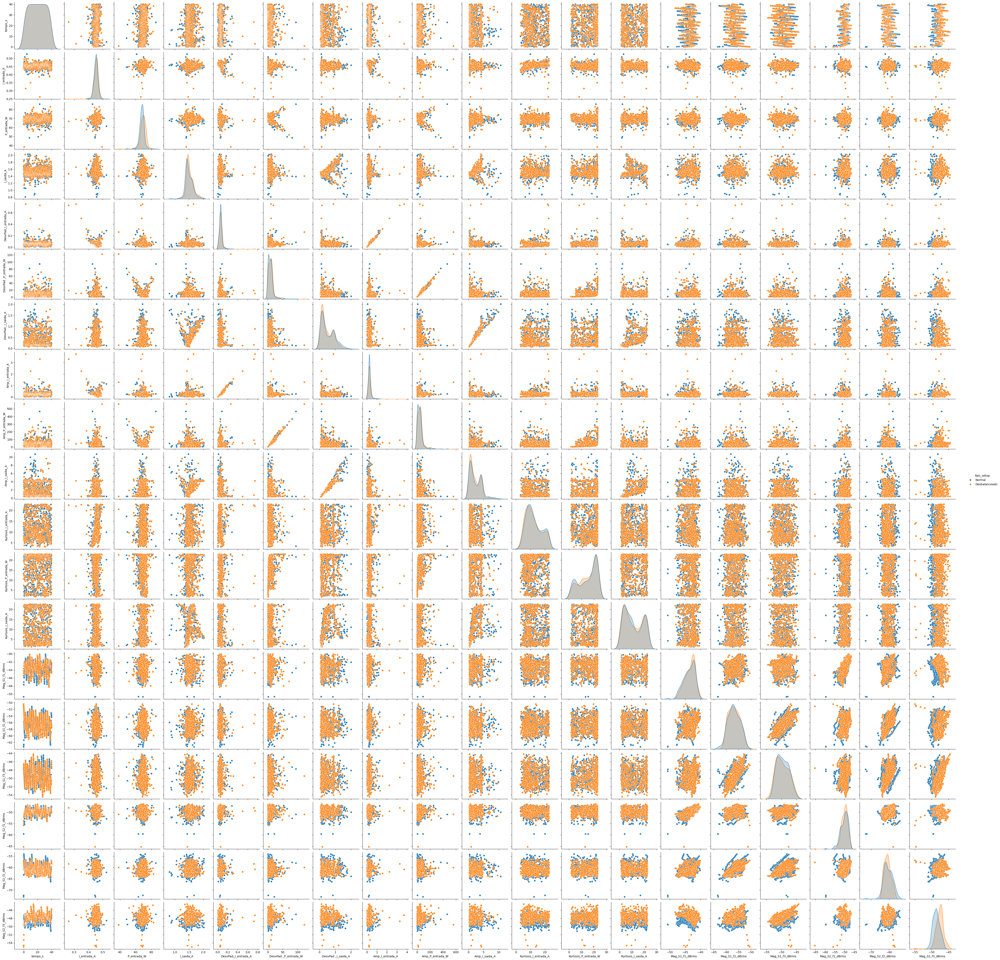

In [42]:
import seaborn as sns
sns.pairplot(df_teste, hue='tipo_setup')

plt.show()